<img src="https://i.imgur.com/w3l7y0U.jpg" width="400">  <br>

This notebook will guide you how to use our code to perform visualization, inference, evaluation and training with detectron2 on our EXPO-HD Dataset

<font size=5>[Paper](https://arxiv.org/abs/2007.14354) | [Blog Post](https://www.datagen.tech/training-data-using-synthetic-expo-markers-to-train-an-object/)
</font> <br>

# About the EXPO-HD Dataset
EXPO-HD: Exact Object Perception using High Distraction Synthetic Data. <br>
The EXPO-HD Dataset is a dataset of Expo whiteboard markers for the purpose of instance segmentation. <br>
The dataset contains three subsets (all include instances segmentation labels):  <br>
- Expo_Synt_V8 Photorealistic synthetic image dataset with 5000 images (1024x1024).
- Expo_Real_DGOffice Real image dataset with 250 images (mainly used for validation and test).
- Expo_Real_India Real image dataset with 1000 images (mainly used for training and comparison to our synthetic data).
<br><br>
<table><tr>
<td><img src="https://i.imgur.com/7MKouv3.png" style="height:300px"/> </td>
<td><img src="https://i.imgur.com/iBeUCXV.jpg" style="height:300px"/> </td>
<td><img src="https://i.imgur.com/b0xrnBs.jpg" style="height:300px"/> </td>
</tr></table>

### Download Datasets and Pretrained Weights
The data can be downloaded from our [blog post](https://www.datagen.tech/training-data-using-synthetic-expo-markers-to-train-an-object/), set DATASET_PATHS and CHECKPOINT_PATH to point the downloaded datasets and weights.

In [1]:
DATASET_PATHS = {
    "Expo_Synt_V8":  "/datasets/Expo_Synt_V8_R3/",
    "Expo_Real_DGOffice": "/datasets/Expo_Real_DataGen_Office_250/",
    "Expo_Real_India": "/datasets/Expo_Real_India/",
    }

CHECKPOINT_PATH = "/datasets/model_0032499.pth" # TODO: change this path

# Visualize, Infer, Evaluate and Train with Detectron2 and our Code

## Installations

### Install Detectron2

In [2]:
pass

### Git Clone our Code

In [3]:
pass

## imports

In [2]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import os
import shutil
import sys
import random
import pickle
import pandas as pd
import matplotlib.pyplot as plt

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog
from detectron2.data.datasets import register_coco_instances
from settings.datagen_setup import setup, get_args
from data.prepare_datasets import prepare_datasets

# import from expo_markers repository
sys.path.append("/expo_markers")
from utils.visualize import visualize_record
from settings.datagen_setup import setup, get_args
from inference.inference_markers import MarkersInference
from evaluation.eval_markers import main as eval_main
from training.train_markers import main as train_main

## Visualize Datasets

[03/21 15:39:11 d2.data.datasets.coco]: Loaded 5000 images in COCO format from /datasets/Expo_Synt_V8_R3/coco_annotations.json


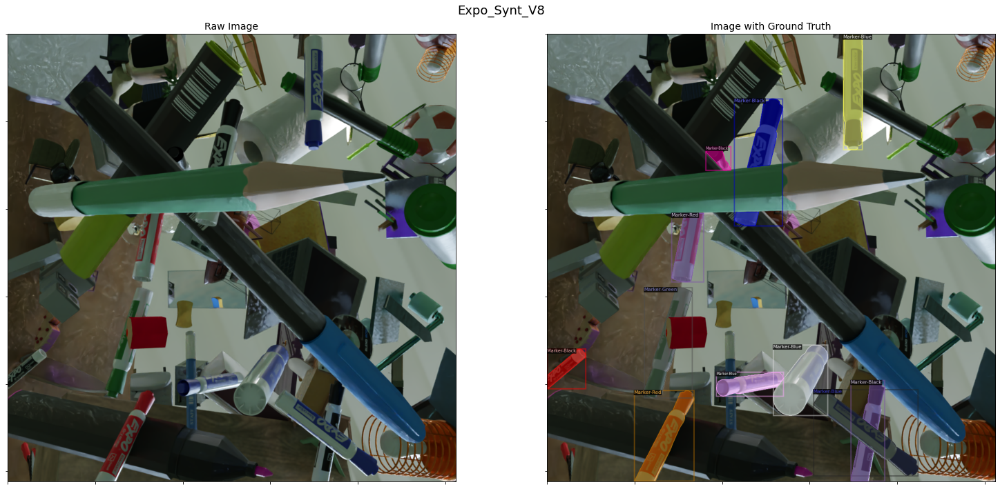

[03/21 15:39:12 d2.data.datasets.coco]: Loaded 250 images in COCO format from /datasets/Expo_Real_DataGen_Office_250/coco_annotations.json


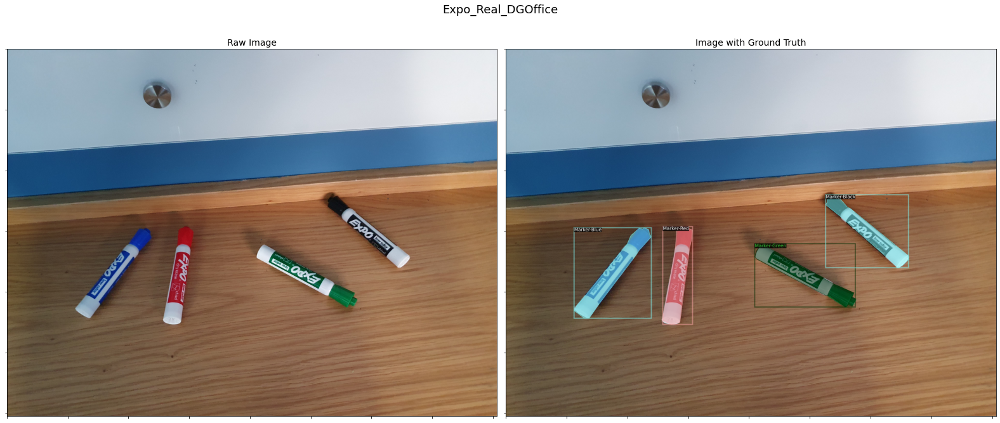

[03/21 15:39:15 d2.data.datasets.coco]: Loaded 1025 images in COCO format from /datasets/Expo_Real_India/coco_annotations.json


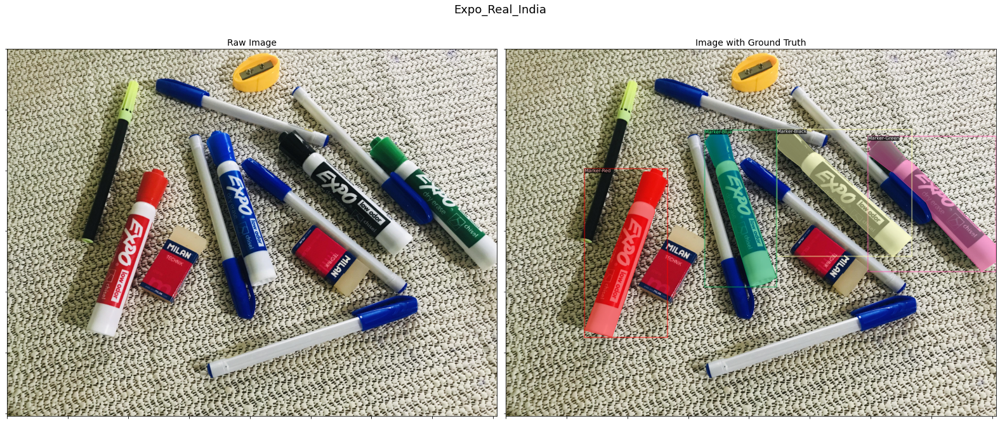

In [3]:
sample_size = 1

for dataset_name, dataset_path in DATASET_PATHS.items():
    DatasetCatalog.clear()
    MetadataCatalog.clear()
    register_coco_instances(name='expo_markers', 
                            metadata={}, 
                            json_file=os.path.join(dataset_path, 'coco_annotations.json'), 
                            image_root=os.path.join(dataset_path, 'images'))

    record_dicts = DatasetCatalog.get('expo_markers')
    meta_data = MetadataCatalog.get('expo_markers')
    for record_dict in np.random.choice(record_dicts, size=sample_size, replace=False):
        visualize_record(record_dict, meta_data, dataset_name)

## Inference

In [4]:
def get_marker_inference_obj(dataset_name: str = None, dataset_inds: str = None):
    DatasetCatalog.clear()
    MetadataCatalog.clear()
    sys.argv = ['']
    args = get_args()
    cfg = setup(args, mode="test")
    cfg.defrost()
    cfg.MODEL.WEIGHTS = CHECKPOINT_PATH
    if dataset_name is not None:
        cfg.DG_TEST_SET_PATH = DATASET_PATHS[dataset_name]
        cfg.DG_TEST_SET_INDS = dataset_inds
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.9
    cfg.freeze()
    if dataset_name is not None:
        prepare_datasets(cfg, ("marker_test",))
    return MarkersInference(cfg)

### Inference on an Image

In [15]:
#!apt install wget
img_url = "https://i.imgur.com/M6uT8ug.jpg"
img_path = "../downloaded_img.jpg"
!wget $img_url -O $img_path
mi = get_marker_inference_obj()

--2021-03-23 09:20:09--  https://i.imgur.com/M6uT8ug.jpg
Resolving i.imgur.com (i.imgur.com)... 151.101.112.193
Connecting to i.imgur.com (i.imgur.com)|151.101.112.193|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3256934 (3.1M) [image/jpeg]
Saving to: ‘../downloaded_img.jpg’

../downloaded_img.j 100%[===================>]   3.11M  4.30MB/s    in 0.7s    

2021-03-23 09:20:10 (4.30 MB/s) - ‘../downloaded_img.jpg’ saved [3256934/3256934]

[03/23 09:20:10 detectron2]: Rank of current process: 0. World size: 1
[03/23 09:20:10 detectron2]: Rank of current process: 0. World size: 1
[03/23 09:20:10 detectron2]: Rank of current process: 0. World size: 1
[03/23 09:20:10 detectron2]: Rank of current process: 0. World size: 1
[03/23 09:20:10 detectron2]: Environment info:
----------------------  ---------------------------------------------------------
sys.platform            linux
Python                  3.8.3 (default, May 19 2020, 18:47:26) [GCC 7.3.0]
numpy       

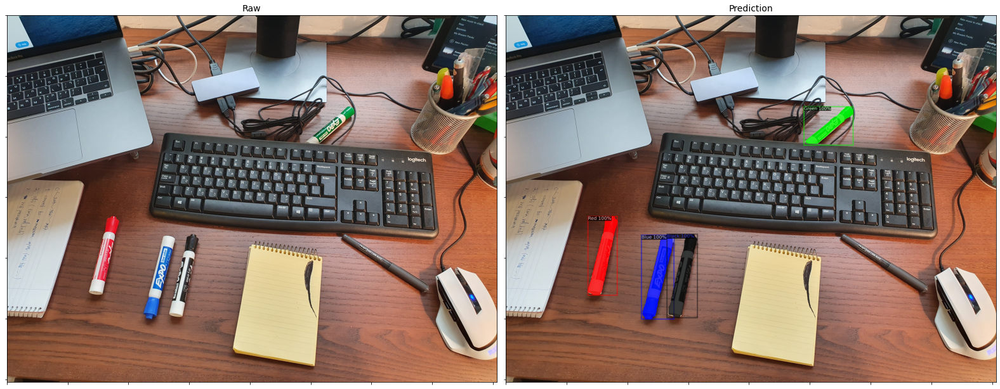

In [17]:
mi.predict_on_image(img_path)

### Inference on a Dataset

In [7]:
mi = get_marker_inference_obj("Expo_Real_DGOffice", "50-250")

[03/21 15:39:24 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:39:24 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:39:24 detectron2]: Environment info:
----------------------  ---------------------------------------------------------
sys.platform            linux
Python                  3.8.3 (default, May 19 2020, 18:47:26) [GCC 7.3.0]
numpy                   1.19.2
detectron2              0.4 @/opt/conda/lib/python3.8/site-packages/detectron2
Compiler                GCC 7.5
CUDA compiler           not available
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.7.0 @/opt/conda/lib/python3.8/site-packages/torch
PyTorch debug build     True
GPU available           True
GPU 0,1                 GeForce RTX 2080 Ti (arch=7.5)
CUDA_HOME               None - invalid!
Pillow                  8.0.0
torchvision             0.8.0 @/opt/conda/lib/python3.8/site-packages/torchvision
torchvision arch flags  /opt/conda/lib/python3.8/site-packages/torchv

[03/21 15:39:25 d2.data.datasets.coco]: Loaded 200 images in COCO format from /datasets/Expo_Real_DataGen_Office_250/coco_annotations_50-250.json
[03/21 15:39:25 d2.data.datasets.coco]: Loaded 200 images in COCO format from /datasets/Expo_Real_DataGen_Office_250/coco_annotations_50-250.json


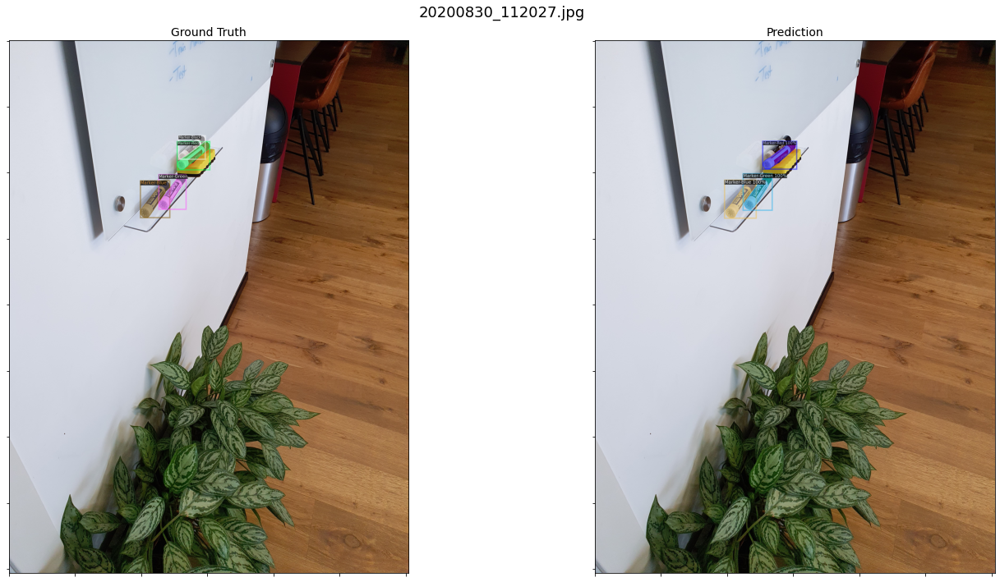

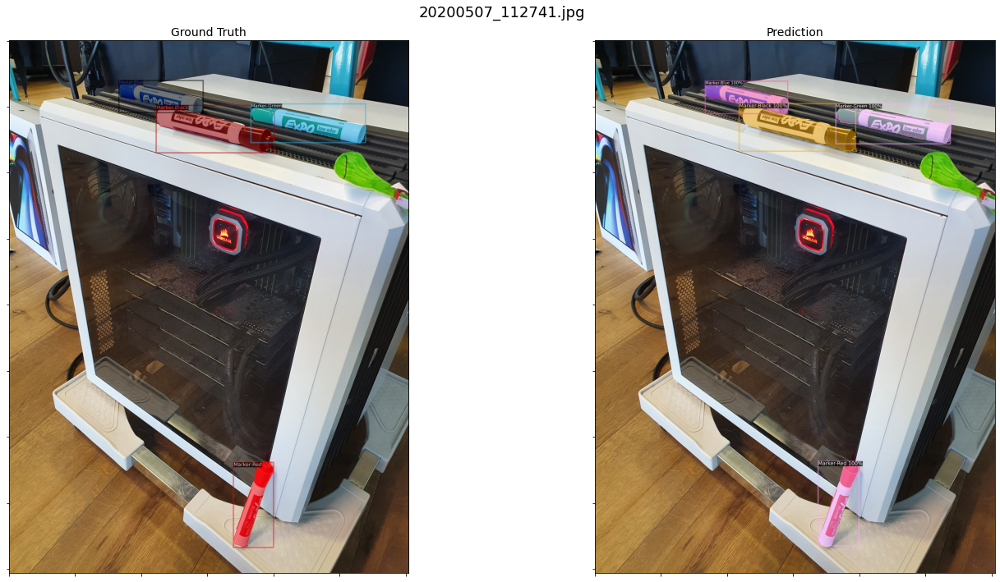

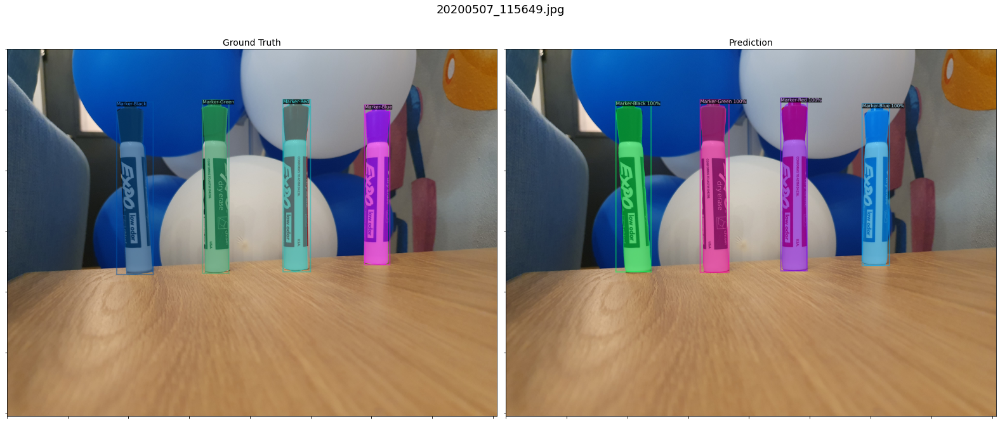

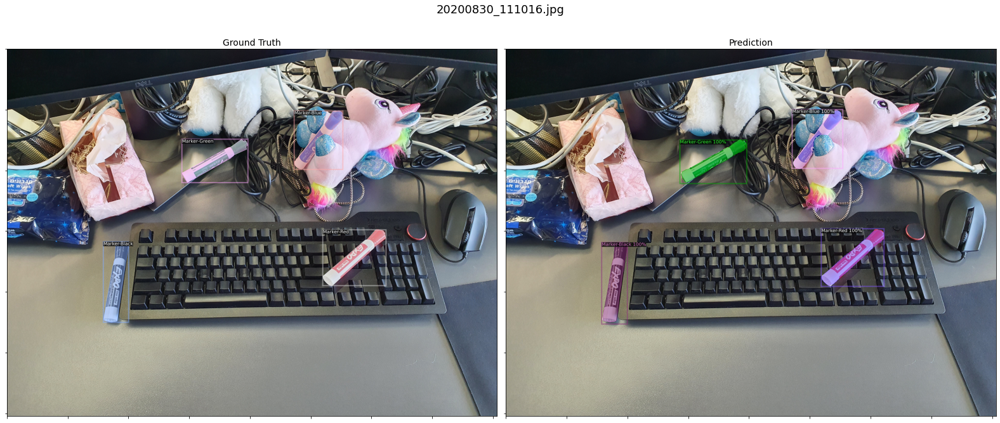

In [8]:
mi.predict_on_set()

## Evaluation

In [9]:
dataset_name = "Expo_Real_DGOffice"
inds = "50-250"
result_evaluation_file_path = '../eval_on_marker_test_synt.pickle'

DatasetCatalog.clear()
MetadataCatalog.clear()
sys.argv = ['',
            'DG_TEST_SET_PATH', DATASET_PATHS[dataset_name],
            'DG_TEST_SET_INDS', inds,
            'MODEL.WEIGHTS', CHECKPOINT_PATH,
            'DG_EVALUATION_OUTPUT_PATH',result_evaluation_file_path]
args = get_args()
eval_main(args)

['bitmask']
[03/21 15:39:37 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:39:37 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:39:37 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:39:37 detectron2]: Environment info:
----------------------  ---------------------------------------------------------
sys.platform            linux
Python                  3.8.3 (default, May 19 2020, 18:47:26) [GCC 7.3.0]
numpy                   1.19.2
detectron2              0.4 @/opt/conda/lib/python3.8/site-packages/detectron2
Compiler                GCC 7.5
CUDA compiler           not available
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.7.0 @/opt/conda/lib/python3.8/site-packages/torch
PyTorch debug build     True
GPU available           True
GPU 0,1                 GeForce RTX 2080 Ti (arch=7.5)
CUDA_HOME               None - invalid!
Pillow                  8.0.0
torchvision             0.8.0 @/opt/conda/lib/python3.8/site-package

OrderedDict([('bbox',
              {'AP': 88.44187105607747,
               'AP50': 98.77966021645159,
               'AP75': 97.85849832362719,
               'APs': nan,
               'APm': nan,
               'APl': 88.44287116174601,
               'AP-Marker-Red': 88.32600478140904,
               'AP-Marker-Green': 87.78477783359406,
               'AP-Marker-Blue': 90.62219566109769,
               'AP-Marker-Black': 87.03450594820913}),
             ('segm',
              {'AP': 83.9866188328287,
               'AP50': 98.80016174989848,
               'AP75': 97.57473130402661,
               'APs': nan,
               'APm': nan,
               'APl': 83.9893308763627,
               'AP-Marker-Red': 84.84887809051209,
               'AP-Marker-Green': 83.58087715951234,
               'AP-Marker-Blue': 84.41118213390656,
               'AP-Marker-Black': 83.10553794738378})])

In [10]:
# load and display the saved pickle evaluation dictionary
with open(result_evaluation_file_path, 'rb') as f:
    eval_res = pickle.load(f)
pd.DataFrame(eval_res)

,bbox,segm
AP,88.441871,83.986619
AP50,98.779660,98.800162
AP75,97.858498,97.574731
APs,NaN,NaN
APm,NaN,NaN
APl,88.442871,83.989331
AP-Marker-Red,88.326005,84.848878
AP-Marker-Green,87.784778,83.580877
AP-Marker-Blue,90.622196,84.411182
AP-Marker-Black,87.034506,83.105538


## Train

In [12]:
dataset_name = "Expo_Real_DGOffice"
train_set_paths = "('" + DATASET_PATHS[dataset_name] + "',)"
inds = "('0-750',)"
training_dir_path = "../training_dir"

if os.path.exists(training_dir_path):
    shutil.rmtree(training_dir_path)
DatasetCatalog.clear()
MetadataCatalog.clear()

sys.argv = ["",
            "DG_TRAIN_SET_PATHS", train_set_paths,
            "DG_TRAIN_SET_INDS", inds,
            "DG_TRAINING_OUTPUT_DIR", training_dir_path,
            "SOLVER.MAX_ITER", "600", # limit training to 30,000 iterations (default=90,000)
            "SOLVER.STEPS", "(25000, 27000)", # decrease learning rate by factor of 0.1 when reaching to the listed steps
            'OUTPUT_DIR', training_dir_path,  # where to save checkpoints and other training files
            ]
args = get_args()


train_main(args)

"""
example for running using the CLI (faster because it uses multipule workers):

python training/train_markers.py \
DG_TRAIN_SET_PATHS "('/datasets/Expo_Synt_V8_R3', '/datasets/Expo_Real_India')" \
DG_TRAIN_SET_INDS "('str0-750', 'str0-50')" \
DG_TRAINING_OUTPUT_DIR ../training_dir \
SOLVER.MAX_ITER 30000 \
SOLVER.STEPS '(25000, 27000)'
"""

['bitmask']
[03/21 15:40:20 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:40:20 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:40:20 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:40:20 detectron2]: Rank of current process: 0. World size: 1
[03/21 15:40:20 detectron2]: Environment info:
----------------------  ---------------------------------------------------------
sys.platform            linux
Python                  3.8.3 (default, May 19 2020, 18:47:26) [GCC 7.3.0]
numpy                   1.19.2
detectron2              0.4 @/opt/conda/lib/python3.8/site-packages/detectron2
Compiler                GCC 7.5
CUDA compiler           not available
DETECTRON2_ENV_MODULE   <not set>
PyTorch                 1.7.0 @/opt/conda/lib/python3.8/site-packages/torch
PyTorch debug build     True
GPU available           True
GPU 0,1                 GeForce RTX 2080 Ti (arch=7.5)
CUDA_HOME               None - invalid!
Pillow                  8.0

/opt/conda/lib/python3.8/site-packages/detectron2/data/detection_utils.py:419: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writeable before converting it to a tensor. This type of warning will be suppressed for the rest of this program. (Triggered internally at  /opt/conda/conda-bld/pytorch_1603729096996/work/torch/csrc/utils/tensor_numpy.cpp:141.)
  torch.stack([torch.from_numpy(np.ascontiguousarray(x)) for x in masks])
/opt/conda/lib/python3.8/site-packages/detectron2/data/detection_utils.py:419: UserWarning: The given NumPy array is not writeable, and PyTorch does not support non-writeable tensors. This means you can write to the underlying (supposedly non-writeable) NumPy array using the tensor. You may want to copy the array to protect its data or make it writea

[03/21 15:40:31 d2.utils.events]:  eta: 0:04:16  iter: 19  total_loss: 2.588  loss_cls: 1.582  loss_box_reg: 0.2734  loss_mask: 0.6906  loss_rpn_cls: 0.02453  loss_rpn_loc: 0.01685  time: 0.4546  data_time: 0.0514  lr: 5.9943e-05  max_mem: 4371M
[03/21 15:40:31 d2.utils.events]:  eta: 0:04:16  iter: 19  total_loss: 2.588  loss_cls: 1.582  loss_box_reg: 0.2734  loss_mask: 0.6906  loss_rpn_cls: 0.02453  loss_rpn_loc: 0.01685  time: 0.4546  data_time: 0.0514  lr: 5.9943e-05  max_mem: 4371M
[03/21 15:40:31 d2.utils.events]:  eta: 0:04:16  iter: 19  total_loss: 2.588  loss_cls: 1.582  loss_box_reg: 0.2734  loss_mask: 0.6906  loss_rpn_cls: 0.02453  loss_rpn_loc: 0.01685  time: 0.4546  data_time: 0.0514  lr: 5.9943e-05  max_mem: 4371M
[03/21 15:40:31 d2.utils.events]:  eta: 0:04:16  iter: 19  total_loss: 2.588  loss_cls: 1.582  loss_box_reg: 0.2734  loss_mask: 0.6906  loss_rpn_cls: 0.02453  loss_rpn_loc: 0.01685  time: 0.4546  data_time: 0.0514  lr: 5.9943e-05  max_mem: 4371M
[03/21 15:40:40 

'\nexample for running using the CLI (faster because it uses multipule workers):\n\npython training/train_markers.py DG_TRAIN_SET_PATHS "(\'/datasets/Expo_Synt_V8_R3\', \'/datasets/Expo_Real_India\')" DG_TRAIN_SET_INDS "(\'str0-750\', \'str0-50\')" DG_TRAINING_OUTPUT_DIR ../training_dir SOLVER.MAX_ITER 30000 SOLVER.STEPS \'(25000, 27000)\'\n'

In [13]:
os.listdir(training_dir_path)

['log.txt',
 'config.yaml',
 'metrics.json',
 'events.out.tfevents.1616341221.5148ee92eab3.1439.0',
 'model_0000499.pth',
 'last_checkpoint',
 'model_final.pth']